# Find the optimum Rotation of CTIO Data in January 2017
==================================================================================================

- author : Sylvie Dagoret-Campagne
- date   : December 9th 2016

The goal is to rotate the image correctly

In [210]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os

In [211]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [212]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal

In [213]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.0.0


In [214]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [215]:
%load_ext Cython

The Cython extension is already loaded. To reload it, use:
  %reload_ext Cython


In [216]:
from IPython.display import Image, display

In [217]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [218]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [219]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

In [220]:
inputdir="./cut_fitsimages"
object_name='HD14943'

In [221]:
#outputdir="./spectrum_fitsimages"
outputdir="./rotated_fitsimages"

In [222]:
ensure_dir(outputdir)

## Location of corrected images
----------------------------------

In [223]:
input_filelist=os.listdir(inputdir) 

In [224]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [225]:
#print input_filelist

In [226]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [227]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list
    

    
    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file
            if re.search('.*fits$',filename):  #example of filename filter
                num_str=re.findall('^cutimg_HD14943_20170117_([0-9]+).fits',file)[0]
                index=int(num_str)
                filelist_fitsimages.append(filename)
                indexes_files.append(index)
    return indexes_files, filelist_fitsimages

    


In [228]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # Make the list

In [229]:
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [230]:
print indexes_files

[ 92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109
 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127
 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145
 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163
 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181
 182 183 184 185 186 187 188 189 190 191 192 193 194 195]


In [231]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [232]:
sorted_numbers=indexes_files[sorted_indexes]

In [233]:
print sorted_indexes

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103]


In [234]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [235]:
#sorted_files

## Build full filename
----------------------------

In [236]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [237]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [238]:
print sorted_filenames.shape

(104,)


## Acces to data of  images
----------------------------------

In [239]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
all_img = []

In [240]:
%%cython

import numpy as np
from astropy.io import fits

def BuildImages(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawImages
    ===============
    """

    
    all_dates = []
    all_airmass = []
    all_images = []
    all_titles = []
    all_header = []
    all_expo = []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        image_corr=hdu_list[0].data
        image=image_corr
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_images.append(image)
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        hdu_list.close()
        
    return all_dates,all_airmass,all_images,all_titles,all_header,all_expo

In [241]:
all_dates,all_airmass,all_images,all_titles,all_header,all_expo=BuildImages(sorted_files,sorted_numbers,object_name)

## Show images
-----------------------

In [242]:
len(all_images)

104

In [243]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowImages(all_images,all_titles,object_name):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        xprofile=np.sum(all_images[index],axis=0)
        x0=np.where(xprofile==xprofile.max())[0][0]
        thex0.append(x0)
        im=axarr[iy,ix].imshow(all_images[index],vmin=-10,vmax=50)
        axarr[iy,ix].set_title(all_titles[index])
    title='Images of '.format(object_name)
    plt.suptitle(title,size=16)
    return thex0

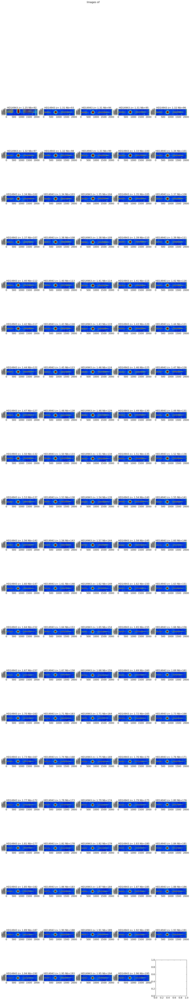

In [244]:
thex0=ShowImages(all_images,all_titles,object_name)

### Shows the transverse profile

In [245]:
DeltaX=600
w=20
ws=80

In [246]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowTransverseProfile(all_images,all_titles,object_name,all_expo):
    """
    ShowTransverseProfile: Show the raw images without background subtraction
    =====================
    """

    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    DeltaX=600
    w=20
    ws=80
    thespectra= []
    they0= []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        data=np.copy(all_images[index])
        data[:,DeltaX-ws:DeltaX+ws]=0
        if(index==0):
            yprofile=np.sum(data,axis=1)  #very special case
        else:
            yprofile=np.sum(data,axis=1)/all_expo[index]
        ymin=1
        ymax=yprofile.max()
        y0=np.where(yprofile==ymax)[0][0]
        they0.append(y0)
        #im=axarr[iy,ix].imshow(data,vmin=-10,vmax=50)
        axarr[iy,ix].semilogy(yprofile)
        axarr[iy,ix].semilogy([y0,y0],[ymin,ymax],'r-')
        axarr[iy,ix].semilogy([y0-w,y0-w],[ymin,ymax],'k-')
        axarr[iy,ix].semilogy([y0+w,y0+w],[ymin,ymax],'k-')
        spectrum2D=np.copy(data[y0-w:y0+w,:])
        xprofile=np.sum(spectrum2D,axis=0)
        thespectra.append(xprofile/(2.*float(w))/all_expo[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    title='Spectrum tranverse profile '.format(object_name)
    plt.suptitle(title,size=16)
    return thespectra,they0

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: divide by zero encountered in divide
  if __name__ == '__main__':
/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':


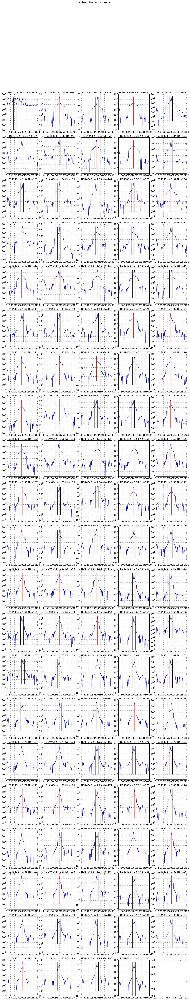

In [247]:
thespectra,they0=ShowTransverseProfile(all_images,all_titles,object_name,all_expo)

In [248]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowSpectrumProfile(spectra,all_titles,object_name):
    """
    ShowSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/5)+1
    
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBSPEC):
        ix=index%5
        iy=index/5
        axarr[iy,ix].plot(spectra[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,200.)
    title='Spectrum 1D profile '.format(object_name)
    plt.suptitle(title,size=16)

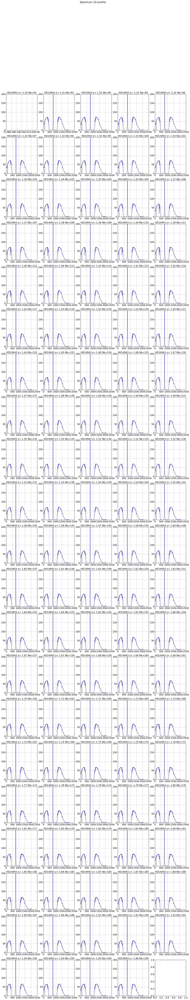

In [249]:
ShowSpectrumProfile(thespectra,all_titles,object_name)

In [250]:
print they0

[109, 198, 205, 193, 196, 195, 192, 194, 193, 195, 197, 196, 187, 189, 193, 201, 195, 206, 190, 194, 192, 192, 208, 201, 198, 196, 195, 203, 194, 193, 192, 201, 198, 202, 188, 191, 200, 191, 187, 190, 192, 191, 207, 204, 192, 205, 194, 205, 192, 203, 193, 195, 193, 198, 195, 203, 198, 199, 202, 199, 198, 200, 209, 200, 198, 210, 196, 214, 203, 196, 200, 205, 199, 206, 205, 195, 197, 205, 200, 196, 205, 199, 206, 205, 194, 195, 205, 204, 196, 201, 195, 198, 201, 202, 203, 201, 195, 189, 201, 195, 205, 196, 203, 200]


In [251]:
print thex0

[1958, 785, 784, 784, 784, 783, 784, 782, 783, 782, 781, 781, 781, 781, 780, 778, 779, 779, 779, 779, 778, 778, 778, 777, 778, 777, 776, 777, 776, 776, 776, 776, 775, 774, 774, 774, 773, 774, 773, 772, 773, 771, 770, 770, 771, 771, 771, 771, 770, 769, 769, 769, 768, 769, 768, 766, 766, 766, 766, 766, 766, 766, 764, 765, 764, 764, 763, 764, 763, 764, 762, 764, 763, 763, 763, 762, 762, 761, 762, 762, 763, 761, 763, 762, 762, 761, 762, 761, 762, 761, 762, 761, 761, 760, 761, 760, 759, 761, 760, 759, 758, 759, 759, 759]


### Test rotation optimum
----------------------------

In [252]:
from scipy import stats 
from scipy import ndimage
from scipy.optimize import curve_fit

In [253]:
sel=1

In [254]:
image_sel=np.copy(all_images[sel])
y0=they0[sel]
x0=thex0[sel]

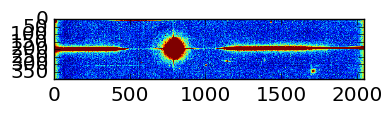

In [255]:
plt.imshow(image_sel,vmin=-10,vmax=50)

In [256]:
region=np.copy(image_sel[y0-100:y0+100,:])
data=np.copy(region)

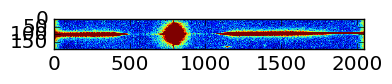

In [257]:
plt.imshow(data,vmin=-10,vmax=50)

### find the orientation by the average

In [258]:
def ComputeMedY(data):
    """
    Compute the median of Y vs X to find later the angle of rotation
    """
    NBINSY=data.shape[0]
    NBINSX=data.shape[1]
    the_medianY=np.zeros(NBINSX)
    the_y=np.zeros(NBINSY)
    for ix in np.arange(NBINSX):
        the_ysum=np.sum(data[:,ix])
        for iy in np.arange(NBINSY):
            the_y[iy]=iy*data[iy,ix]
        if(the_ysum>0):
            med=np.sum(the_y)/the_ysum
            the_medianY[ix]=med
    return the_medianY

In [259]:
def ComputeAveY(data):
    """
    Compute the average of Y vs X to find later the angle of rotation
    """
    NBINSY=data.shape[0]
    NBINSX=data.shape[1]
    the_averY=np.zeros(NBINSX)
    the_y=np.zeros(NBINSY)
    for ix in np.arange(NBINSX):
        the_ysum=np.sum(data[:,ix])
        for iy in np.arange(NBINSY):
            the_y[iy]=iy*data[iy,ix]
        if(the_ysum>0):
            med=np.sum(the_y)/the_ysum
            the_averY[ix]=med
    return the_averY

In [260]:

xindex=np.arange(data.shape[1])

In [261]:
#selected_indexes=np.where(np.logical_or(xindex<480,xindex>1100))

In [262]:
selected_indexes=np.where(np.logical_and(np.logical_or(xindex<460,xindex>1100),xindex< 1500))

In [263]:
yaver=ComputeAveY(data)

In [264]:
XtoFit=xindex[selected_indexes]
YtoFit=yaver[selected_indexes]

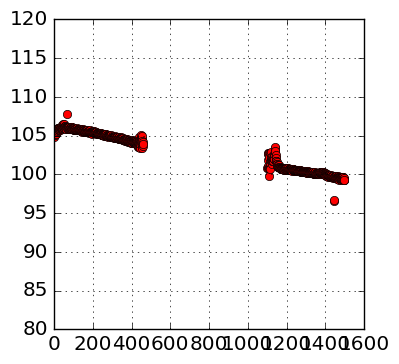

In [265]:
plt.plot(XtoFit,YtoFit,'ro')
plt.ylim(80,120)
plt.grid(True)

In [266]:
def fit_func(x, a, b):
    return a*x + b

In [267]:
from scipy.optimize import curve_fit
   

In [268]:
params = curve_fit(fit_func, XtoFit, YtoFit)
[a, b] = params[0]

In [269]:
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = fit_func(x_new,a,b)

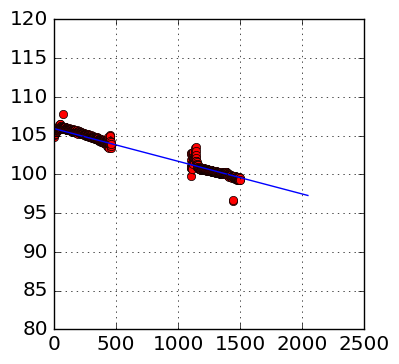

In [270]:
plt.plot(XtoFit,YtoFit,'ro')
plt.plot(x_new,y_new,'b-')
plt.ylim(80,120)
plt.grid(True)

In [271]:
print a,b

-0.00421483015133 105.914530078


In [272]:
print np.arctan(a)*180/np.pi

-0.241490549032


## Find Rotation angle for each image
----------------------------------------------

In [273]:
def ComputeRotationAnge(all_images,thex0,they0,all_titles,object_name):
    """
    ComputeRotationAnge
    ===================
    
    input:
    ------
    all_images
    thex0
    they0
    
    
    output:
    ------
    param_a
    param_b
    
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    
    param_a=np.zeros(NBIMAGES)
    param_b=np.zeros(NBIMAGES)

    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        
        image=all_images[index]    
        
        image_sel=np.copy(image)
        y0=they0[index]
        x0=thex0[index]
        
        # extract a region of 200 x 1000 centered at y=100,x=500
        
        region=np.copy(image_sel[y0-100:y0+100,:])
        data=np.copy(region)
        
        xindex=np.arange(data.shape[1])
        #selected_indexes=np.where(np.logical_or(xindex<480,xindex>1100))
        selected_indexes=np.where(np.logical_and(np.logical_or(xindex<460,xindex>1100),xindex< 1500))
        # compute Y vs X
        yaver=ComputeAveY(data)
        
        XtoFit=xindex[selected_indexes]
        YtoFit=yaver[selected_indexes]
        # does the fit
        params = curve_fit(fit_func, XtoFit, YtoFit)
        [a, b] = params[0]
        
        param_a[index]=a
        param_b[index]=b
        
        print index,' y = ',a,' * x + ',b
        x_new = np.linspace(xindex.min(),xindex.max(), 50)
        y_new = fit_func(x_new,a,b)
    
        im=axarr[iy,ix].plot(XtoFit,YtoFit,'ro')
        im=axarr[iy,ix].plot(x_new,y_new,'b-')
        axarr[iy,ix].set_title(all_titles[index])
        
        axarr[iy,ix].set_ylim(80,120)
        axarr[iy,ix].grid(True)
        
    title='Fit rotation angle of '.format(object_name)    
    plt.suptitle(title,size=16)
    return param_a,param_b
    
    

0  y =  -0.00339261740274  * x +  115.163690405
1  y =  -0.00421483015133  * x +  105.914530078
2  y =  -0.00420588144091  * x +  106.175570244
3  y =  -0.00417841922982  * x +  105.290836922
4  y =  -0.00415905104314  * x +  105.546600662
5  y =  -0.00416770865623  * x +  105.731386155
6  y =  -0.00419276508151  * x +  105.819750042
7  y =  -0.00418932844544  * x +  105.903298013
8  y =  -0.0041989986553  * x +  105.324201358
9  y =  -0.00419963801901  * x +  105.440570879
10  y =  -0.0042220443273  * x +  105.795137335
11  y =  -0.00415668388981  * x +  105.504806601
12  y =  -0.00418861404009  * x +  105.998407296
13  y =  -0.00415106898457  * x +  105.374411756
14  y =  -0.00415662473161  * x +  105.997246979
15  y =  -0.00415560350877  * x +  105.672613946
16  y =  -0.00412447344072  * x +  105.44665354
17  y =  -0.00415837451483  * x +  105.643484534
18  y =  -0.00410984254746  * x +  105.802632295
19  y =  -0.00418068546902  * x +  105.878762439
20  y =  -0.00415998870153  * x +

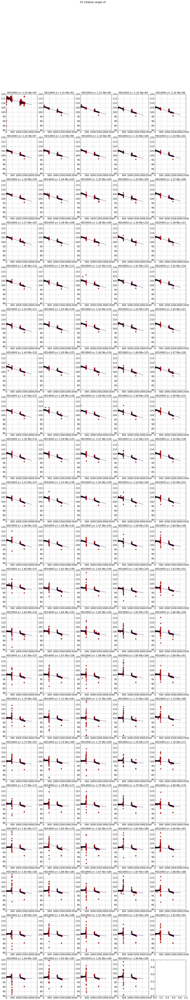

In [274]:
all_a,all_b=ComputeRotationAnge(all_images,thex0,they0,all_titles,object_name)

In [275]:
all_angles=np.arctan(all_a)*180./np.pi

### Choose here which rotation angle to apply

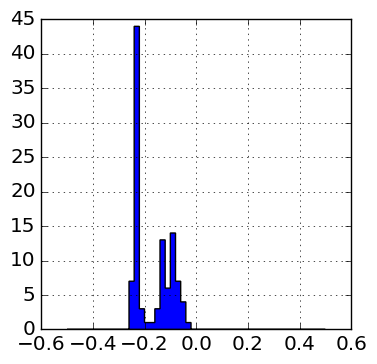

In [276]:
#hist(x, bins=10, range=None, normed=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, hold=None, data=None, **kwargs)
n, bins, patches=plt.hist(all_angles,bins=50,range=[-.5,.5],histtype='stepfilled')
plt.grid(True)

In [277]:
selected_angles=all_angles[np.where(all_angles<-0.15)]

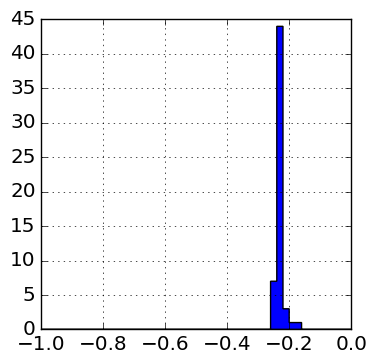

In [278]:
n, bins, patches=plt.hist(selected_angles,bins=50,range=[-1.,0],histtype='stepfilled')
plt.grid(True)

In [279]:
rotation_average=selected_angles.mean()

In [280]:
final_rotation_angles=np.ones(all_angles.shape[0])*rotation_average

## Now turn the images accordingly

In [281]:
def TurnTheImages(all_images,all_angles,all_titles,object_name):
    """
    TurnTheImages
    =============
    
    input:
    ------
    all_images:
    all_angles:
    
    
    output:
    ------
    all_rotated_images
    
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    
    all_rotated_images = []

    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        
        image=all_images[index]    
        angle=all_angles[index]    
        data=np.copy(image)
        
        rotated_image=ndimage.interpolation.rotate(data,angle)
        
        all_rotated_images.append(rotated_image)
        
        im=axarr[iy,ix].imshow(rotated_image,vmin=0,vmax=50)
        im=axarr[iy,ix].plot(x_new,y_new,'b-')
        axarr[iy,ix].set_title(all_titles[index])
        
        
        axarr[iy,ix].grid(True)
        
    title='Rotated images for '.format(object_name)    
    plt.suptitle(title,size=16)
    return all_rotated_images

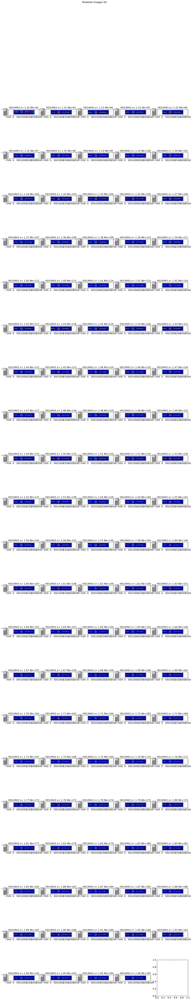

In [282]:
#turned_images=TurnTheImages(all_images,all_angles,all_titles,object_name)
turned_images=TurnTheImages(all_images,final_rotation_angles,all_titles,object_name) #same rotation for each image

## Check rotation

In case of bad rotation, check by eye

In [307]:
sel=106

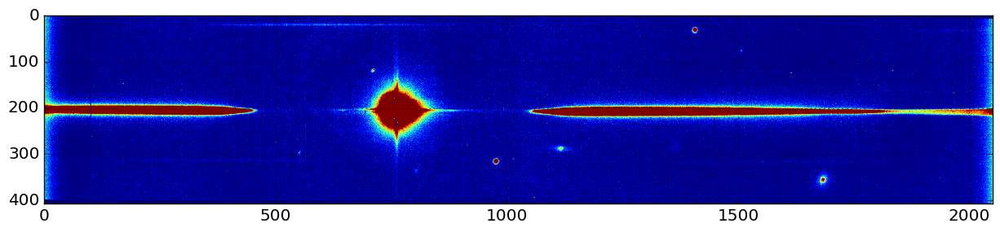

In [302]:
plt.figure(figsize=(15,10))
plt.imshow(turned_images[sel],vmin=0,vmax=100)
plt.grid(True)

In [285]:
image_sel=np.copy(turned_images[sel])
y0=they0[sel]
x0=thex0[sel]

In [286]:
region=np.copy(image_sel[y0-100:y0+100,:])
#region[:,500-100:500+100]=0
data=np.copy(region)

In [287]:
xindex=np.arange(data.shape[1])

In [288]:
#selected_indexes=np.where(np.logical_or(xindex<480,xindex>1100))
selected_indexes=np.where(np.logical_and(np.logical_or(xindex<460,xindex>1100),xindex< 1500))

In [289]:
yaver=ComputeAveY(data)

In [290]:
XtoFit=xindex[selected_indexes]
YtoFit=yaver[selected_indexes]

In [291]:
params = curve_fit(fit_func, XtoFit, YtoFit)
[a, b] = params[0]

In [292]:
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = fit_func(x_new,a,b)

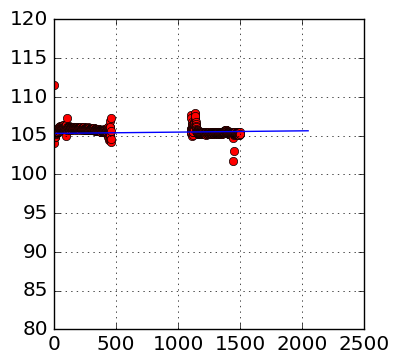

In [293]:
plt.plot(XtoFit,YtoFit,'ro')
plt.plot(x_new,y_new,'b-')
plt.ylim(80,120)
plt.grid(True)

### prepare outputfilename

In [294]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [295]:
newfullfilenames

['./rotated_fitsimages/rotimg_HD14943_20170117_092.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_093.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_094.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_095.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_096.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_097.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_098.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_099.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_100.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_101.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_102.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_103.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_104.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_105.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_106.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_107.fits',
 './rotated_fitsimages/rotimg_HD14943_20170117_108.fits',
 './rotated_fi

### Save outputfilename

In [296]:
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=turned_images[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)

In [297]:
!ls

Extract_Spectrum_HD14943.ipynb   logbk_HD14943_ctio2017Jan17.fits
FindCentralStar_HD14943.ipynb    overscan_subtract_andTrim.py
FindOptRot_HD14943.ipynb         overscan_subtract_andTrim.pyc
MakeLogBook.ipynb                processed_fitsimages
OverscanAllImages.ipynb          rotated_fitsimages
ViewAllImages_HD14943.ipynb      skylev.py
compute.py                       spectrum_fitsspec
cut_fitsimages                   telinst.py
hapi.py                          telinst.pyc
header.py                        trim_images
logbk_HD14943_ctio2017Jan17.csv


In [298]:
# !ls -l cut_fitsimages